In [2]:
import os

# Find your uploaded zip file
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/datasets/vineelgundala/processed/processed/data.yaml
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/Screenshot-2023-11-01-024837_png_jpg.rf.88a97894cd867f8c8c8a1202145b6b97.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/image_48_jpg.rf.e2d6f5d2be2d72b68d292599a11fcebb.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/image_187_jpg.rf.704d557a0bc1f89bc45dbce570e1b96e.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/-4430-_png_jpg.rf.efdf15f450e5ab5890f25cd027bcd37e.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/-1318-_png_jpg.rf.767d9b6565d37e4bb233d674450bf8a0.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/-3500-_png_jpg.rf.dfdf3251c40e677e8fb08b11002d9142.txt
/kaggle/input/datasets/vineelgundala/processed/processed/valid/labels/people-2048-_jpg.rf.1aef225ea16068748471f90823b5ff1a.txt
/kaggle/input/datasets/vineelgundala/

In [3]:
import os
import glob

BASE_PATH = '/kaggle/input/datasets/vineelgundala/processed/processed'

TRAIN_IMG = os.path.join(BASE_PATH, 'train', 'images')
TRAIN_LBL = os.path.join(BASE_PATH, 'train', 'labels')
VAL_IMG   = os.path.join(BASE_PATH, 'valid', 'images')
VAL_LBL   = os.path.join(BASE_PATH, 'valid', 'labels')
TEST_IMG  = os.path.join(BASE_PATH, 'test',  'images')
TEST_LBL  = os.path.join(BASE_PATH, 'test',  'labels')

train_imgs = glob.glob(os.path.join(TRAIN_IMG, '*.jpg'))
val_imgs   = glob.glob(os.path.join(VAL_IMG,   '*.jpg'))
test_imgs  = glob.glob(os.path.join(TEST_IMG,  '*.jpg'))

print(f'Train images : {len(train_imgs)}')
print(f'Val images   : {len(val_imgs)}')
print(f'Test images  : {len(test_imgs)}')
print(f'Total        : {len(train_imgs)+len(val_imgs)+len(test_imgs)}')

Train images : 23362
Val images   : 6185
Test images  : 3315
Total        : 32862


In [4]:
# Install grad-cam
!pip install grad-cam -q

# Core imports
import os
import glob
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import cv2

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision import models

# Metrics
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

print(f'PyTorch version : {torch.__version__}')
print(f'CUDA available  : {torch.cuda.is_available()}')
print(f'Device          : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 59.9 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 85.6 MB/s eta 0:00:00:00:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 

In [5]:
# Base path
BASE_PATH = '/kaggle/input/datasets/vineelgundala/processed/processed'

# Paths
TRAIN_IMG = os.path.join(BASE_PATH, 'train', 'images')
TRAIN_LBL = os.path.join(BASE_PATH, 'train', 'labels')
VAL_IMG   = os.path.join(BASE_PATH, 'valid', 'images')
VAL_LBL   = os.path.join(BASE_PATH, 'valid', 'labels')
TEST_IMG  = os.path.join(BASE_PATH, 'test',  'images')
TEST_LBL  = os.path.join(BASE_PATH, 'test',  'labels')

# Final classes
FINAL_CLASSES = {
    0: 'hardhat',
    1: 'no_hardhat',
    2: 'safety_vest',
    3: 'no_safety_vest',
    4: 'person',
    5: 'fall_detected'
}

# Device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')
print(f'Classes: {list(FINAL_CLASSES.values())}')

Using device: cuda
Classes: ['hardhat', 'no_hardhat', 'safety_vest', 'no_safety_vest', 'person', 'fall_detected']


In [6]:
class PPEDataset(Dataset):
    """
    Custom PyTorch Dataset for PPE detection.
    
    Strategy: Instead of classifying whole images, we crop individual 
    object regions using YOLO bounding box annotations and classify each crop.
    Each crop becomes one training sample with its class label.
    
    This gives us ~72,985 training samples from 23,362 images.
    """
    
    def __init__(self, img_folder, lbl_folder, transform=None):
        self.img_folder = img_folder
        self.lbl_folder = lbl_folder
        self.transform  = transform
        self.samples    = []  # list of (img_path, x1, y1, x2, y2, class_id)
        
        self._load_samples()
    
    def _load_samples(self):
        """
        Read every annotation file and create one sample per bounding box.
        Each sample = one cropped object region + its class label.
        """
        img_files = glob.glob(os.path.join(self.img_folder, '*.jpg'))
        
        for img_path in img_files:
            img_filename = os.path.basename(img_path)
            lbl_filename = img_filename.replace('.jpg', '.txt')
            lbl_path     = os.path.join(self.lbl_folder, lbl_filename)
            
            if not os.path.exists(lbl_path):
                continue
            
            # Get image dimensions for denormalization
            img = Image.open(img_path)
            W, H = img.size
            img.close()
            
            with open(lbl_path, 'r') as f:
                lines = f.readlines()
            
            for line in lines:
                line = line.strip()
                if not line:
                    continue
                
                parts    = line.split()
                class_id = int(parts[0])
                
                # YOLO format: x_center, y_center, width, height (normalized)
                x_center = float(parts[1]) * W
                y_center = float(parts[2]) * H
                width    = float(parts[3]) * W
                height   = float(parts[4]) * H
                
                # Convert to corner coordinates
                x1 = int(x_center - width  / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width  / 2)
                y2 = int(y_center + height / 2)
                
                # Clamp to image boundaries
                x1 = max(0, x1)
                y1 = max(0, y1)
                x2 = min(W, x2)
                y2 = min(H, y2)
                
                # Skip invalid or too small crops
                if x2 - x1 < 10 or y2 - y1 < 10:
                    continue
                
                self.samples.append((img_path, x1, y1, x2, y2, class_id))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, x1, y1, x2, y2, class_id = self.samples[idx]
        
        # Open image and crop the object region
        img  = Image.open(img_path).convert('RGB')
        crop = img.crop((x1, y1, x2, y2))
        
        if self.transform:
            crop = self.transform(crop)
        
        return crop, class_id

print('PPEDataset class defined successfully')

PPEDataset class defined successfully


In [7]:
# Image transforms
# Training transforms include augmentation to improve generalization
# Validation and test transforms only resize and normalize — no augmentation

TRAIN_TRANSFORMS = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

VAL_TRANSFORMS = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

print('Creating datasets — this will take a few minutes...')
print('Loading training samples...')
train_dataset = PPEDataset(TRAIN_IMG, TRAIN_LBL, transform=TRAIN_TRANSFORMS)

print('Loading validation samples...')
val_dataset   = PPEDataset(VAL_IMG,   VAL_LBL,   transform=VAL_TRANSFORMS)

print('Loading test samples...')
test_dataset  = PPEDataset(TEST_IMG,  TEST_LBL,  transform=VAL_TRANSFORMS)

print(f'\nDataset sizes:')
print(f'  Train samples : {len(train_dataset)}')
print(f'  Val samples   : {len(val_dataset)}')
print(f'  Test samples  : {len(test_dataset)}')

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=64, 
                          shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=64, 
                          shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=64, 
                          shuffle=False, num_workers=2, pin_memory=True)

print(f'\nDataLoader sizes:')
print(f'  Train batches : {len(train_loader)}')
print(f'  Val batches   : {len(val_loader)}')
print(f'  Test batches  : {len(test_loader)}')

Creating datasets — this will take a few minutes...
Loading training samples...
Loading validation samples...
Loading test samples...

Dataset sizes:
  Train samples : 71465
  Val samples   : 16937
  Test samples  : 9619

DataLoader sizes:
  Train batches : 1117
  Val batches   : 265
  Test batches  : 151


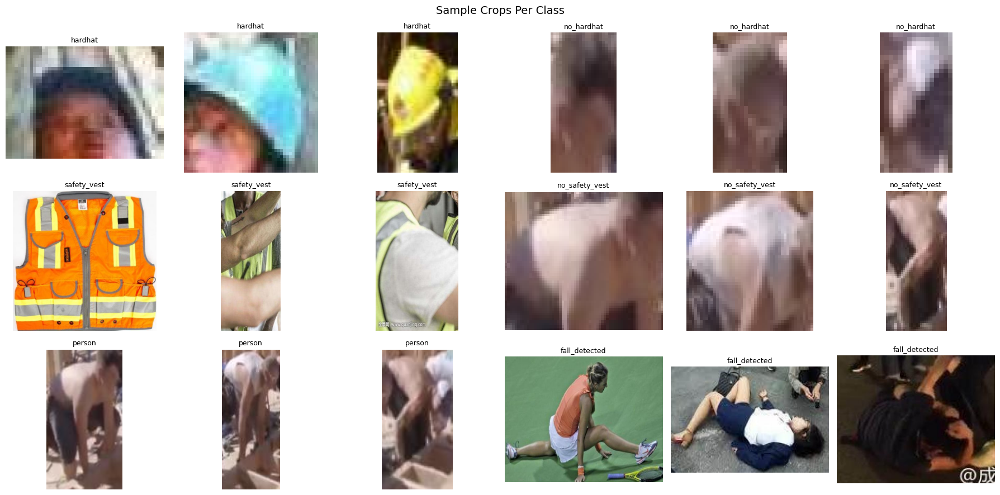

In [8]:
fig, axes = plt.subplots(3, 6, figsize=(18, 9))
axes = axes.flatten()

# Get samples for each class
samples_per_class = {i: [] for i in range(6)}
for sample in train_dataset.samples:
    class_id = sample[5]
    if len(samples_per_class[class_id]) < 3:
        samples_per_class[class_id].append(sample)

# Display crops
idx = 0
for class_id in range(6):
    for sample in samples_per_class[class_id]:
        img_path, x1, y1, x2, y2, cid = sample
        img  = Image.open(img_path).convert('RGB')
        crop = img.crop((x1, y1, x2, y2))
        img.close()
        
        axes[idx].imshow(crop)
        axes[idx].set_title(FINAL_CLASSES[class_id], fontsize=9)
        axes[idx].axis('off')
        idx += 1

plt.suptitle('Sample Crops Per Class', fontsize=14)
plt.tight_layout()
plt.show()

In [9]:
import torchvision.models as models

def build_model(num_classes=6, dropout=0.3):
    """
    EfficientNet-B0 pretrained on ImageNet.
    We replace the final classification layer with our own
    to classify 6 PPE compliance classes.
    
    Why EfficientNet-B0?
    - Lightweight and fast — good for deployment
    - Strong accuracy despite small size
    - Pretrained on ImageNet — transfer learning advantage
    - Directly taught in CampusX transfer learning module
    """
    model = models.efficientnet_b0(weights='IMAGENET1K_V1')
    
    # Freeze all layers first
    for param in model.parameters():
        param.requires_grad = False
    
    # Unfreeze last 3 blocks for fine tuning
    for param in model.features[6:].parameters():
        param.requires_grad = True
    
    # Replace classifier head with our own
    in_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=dropout),
        nn.Linear(in_features, 256),
        nn.ReLU(),
        nn.Dropout(p=dropout),
        nn.Linear(256, num_classes)
    )
    
    return model

# Build model and move to GPU
model = build_model(num_classes=6)
model = model.to(DEVICE)

# Count trainable parameters
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'Model        : EfficientNet-B0')
print(f'Total params : {total_params:,}')
print(f'Trainable    : {trainable_params:,}')
print(f'Frozen       : {total_params - trainable_params:,}')
print(f'Model on     : {next(model.parameters()).device}')

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 128MB/s] 


Model        : EfficientNet-B0
Total params : 4,337,026
Trainable    : 3,485,218
Frozen       : 851,808
Model on     : cuda:0


In [10]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Calculate class weights to handle imbalance
# More weight to underrepresented classes
class_counts = torch.tensor([
    33064,  # hardhat
    13693,  # no_hardhat
     7451,  # safety_vest
     6340,  # no_safety_vest
     9288,  # person
     3149,  # fall_detected
], dtype=torch.float)

# Inverse frequency weighting
# Classes with fewer samples get higher weight
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * len(class_counts)
class_weights = class_weights.to(DEVICE)

print('Class weights (higher = more attention during training):')
for i, (name, weight) in enumerate(zip(FINAL_CLASSES.values(), class_weights)):
    print(f'  {name:<20} : {weight:.4f}')

# Loss function with class weights
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Optimizer — different learning rates for encoder vs classifier head
optimizer = optim.Adam([
    {'params': model.features[6:].parameters(), 'lr': 1e-4},
    {'params': model.classifier.parameters(),   'lr': 3e-4}
])

# Scheduler — reduces learning rate when validation loss stops improving
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    patience=3,
    factor=0.5
)

print(f'\nLoss     : CrossEntropyLoss with class weights')
print(f'Optimizer: Adam with differential learning rates')
print(f'Scheduler: ReduceLROnPlateau patience=3 factor=0.5')

Class weights (higher = more attention during training):
  hardhat              : 0.2212
  no_hardhat           : 0.5341
  safety_vest          : 0.9815
  no_safety_vest       : 1.1535
  person               : 0.7874
  fall_detected        : 2.3224

Loss     : CrossEntropyLoss with class weights
Optimizer: Adam with differential learning rates
Scheduler: ReduceLROnPlateau patience=3 factor=0.5


In [11]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct      = 0
    total        = 0
    
    for images, labels in tqdm(loader, desc='Training', leave=False):
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss    = criterion(outputs, labels)
        loss.backward()
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted  = outputs.max(1)
        total        += labels.size(0)
        correct      += predicted.eq(labels).sum().item()
    
    epoch_loss = running_loss / len(loader)
    epoch_acc  = 100.0 * correct / total
    return epoch_loss, epoch_acc


def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct      = 0
    total        = 0
    
    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validating', leave=False):
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            loss    = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted  = outputs.max(1)
            total        += labels.size(0)
            correct      += predicted.eq(labels).sum().item()
    
    epoch_loss = running_loss / len(loader)
    epoch_acc  = 100.0 * correct / total
    return epoch_loss, epoch_acc

print('Training and validation functions defined successfully')

Training and validation functions defined successfully


In [12]:
# Training configuration
NUM_EPOCHS  = 20
SAVE_PATH   = '/kaggle/working/best_model.pth'

# History tracking
history = {
    'train_loss': [], 'val_loss': [],
    'train_acc':  [], 'val_acc':  []
}

best_val_loss = float('inf')
best_epoch    = 0

print(f'Starting training for {NUM_EPOCHS} epochs')
print(f'Train samples : {len(train_dataset)}')
print(f'Val samples   : {len(val_dataset)}')
print('=' * 60)

for epoch in range(NUM_EPOCHS):
    
    # Train
    train_loss, train_acc = train_one_epoch(
        model, train_loader, criterion, optimizer, DEVICE
    )
    
    # Validate
    val_loss, val_acc = validate(
        model, val_loader, criterion, DEVICE
    )
    
    # Scheduler step
    scheduler.step(val_loss)
    
    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_acc'].append(train_acc)
    history['val_acc'].append(val_acc)
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_epoch    = epoch + 1
        torch.save({
            'epoch':       epoch + 1,
            'model_state': model.state_dict(),
            'optimizer':   optimizer.state_dict(),
            'val_loss':    val_loss,
            'val_acc':     val_acc,
            'classes':     FINAL_CLASSES
        }, SAVE_PATH)
        saved = '  *** Best model saved ***'
    else:
        saved = ''
    
    print(f'Epoch [{epoch+1:02d}/{NUM_EPOCHS}] '
          f'Train Loss: {train_loss:.4f} Acc: {train_acc:.2f}% | '
          f'Val Loss: {val_loss:.4f} Acc: {val_acc:.2f}%'
          f'{saved}')

print('=' * 60)
print(f'Training complete. Best model at epoch {best_epoch}')
print(f'Best val loss : {best_val_loss:.4f}')
print(f'Model saved to: {SAVE_PATH}')

Starting training for 20 epochs
Train samples : 71465
Val samples   : 16937


Epoch [01/20] Train Loss: 0.3910 Acc: 87.42% | Val Loss: 0.1548 Acc: 95.54%  *** Best model saved ***


Epoch [02/20] Train Loss: 0.2350 Acc: 92.32% | Val Loss: 0.1452 Acc: 95.86%  *** Best model saved ***


Epoch [03/20] Train Loss: 0.1984 Acc: 93.50% | Val Loss: 0.1298 Acc: 96.16%  *** Best model saved ***


Epoch [04/20] Train Loss: 0.1736 Acc: 94.17% | Val Loss: 0.1232 Acc: 96.28%  *** Best model saved ***


Epoch [05/20] Train Loss: 0.1554 Acc: 94.76% | Val Loss: 0.1177 Acc: 96.78%  *** Best model saved ***


Epoch [06/20] Train Loss: 0.1401 Acc: 95.28% | Val Loss: 0.1152 Acc: 96.88%  *** Best model saved ***


Epoch [07/20] Train Loss: 0.1267 Acc: 95.55% | Val Loss: 0.1188 Acc: 96.89%


Epoch [08/20] Train Loss: 0.1190 Acc: 95.92% | Val Loss: 0.1191 Acc: 96.97%


Epoch [09/20] Train Loss: 0.1060 Acc: 96.21% | Val Loss: 0.1187 Acc: 97.02%


Epoch [10/20] Train Loss: 0.0994 Acc: 96.44% | Val Loss: 0.1267 Acc: 97.13%


Epoch [11/20] Train Loss: 0.0833 Acc: 96.95% | Val Loss: 0.1216 Acc: 96.98%


Epoch [12/20] Train Loss: 0.0761 Acc: 97.13% | Val Loss: 0.1332 Acc: 97.21%


Epoch [13/20] Train Loss: 0.0727 Acc: 97.28% | Val Loss: 0.1237 Acc: 97.04%


Epoch [14/20] Train Loss: 0.0670 Acc: 97.44% | Val Loss: 0.1198 Acc: 97.43%


Epoch [15/20] Train Loss: 0.0613 Acc: 97.61% | Val Loss: 0.1180 Acc: 97.48%


Epoch [16/20] Train Loss: 0.0565 Acc: 97.69% | Val Loss: 0.1250 Acc: 97.27%


Epoch [17/20] Train Loss: 0.0565 Acc: 97.77% | Val Loss: 0.1313 Acc: 97.43%


Epoch [18/20] Train Loss: 0.0539 Acc: 97.83% | Val Loss: 0.1259 Acc: 97.48%


Epoch [19/20] Train Loss: 0.0498 Acc: 98.00% | Val Loss: 0.1299 Acc: 97.45%


Epoch [20/20] Train Loss: 0.0482 Acc: 98.05% | Val Loss: 0.1278 Acc: 97.59%
Training complete. Best model at epoch 6
Best val loss : 0.1152
Model saved to: /kaggle/working/best_model.pth


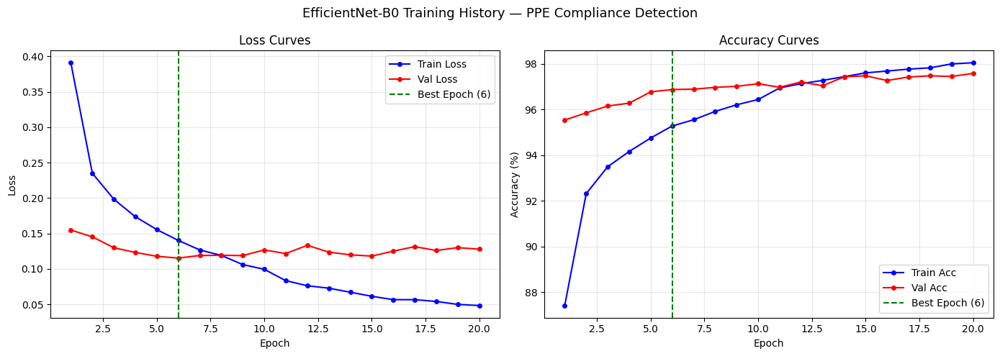

Training curves saved to /kaggle/working/training_curves.png


In [13]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

epochs = range(1, NUM_EPOCHS + 1)

# Loss curves
axes[0].plot(epochs, history['train_loss'], 'b-o', 
             label='Train Loss', markersize=4)
axes[0].plot(epochs, history['val_loss'],   'r-o', 
             label='Val Loss',   markersize=4)
axes[0].axvline(x=best_epoch, color='green', 
                linestyle='--', label=f'Best Epoch ({best_epoch})')
axes[0].set_title('Loss Curves')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Accuracy curves
axes[1].plot(epochs, history['train_acc'], 'b-o', 
             label='Train Acc', markersize=4)
axes[1].plot(epochs, history['val_acc'],   'r-o', 
             label='Val Acc',   markersize=4)
axes[1].axvline(x=best_epoch, color='green', 
                linestyle='--', label=f'Best Epoch ({best_epoch})')
axes[1].set_title('Accuracy Curves')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('EfficientNet-B0 Training History — PPE Compliance Detection', 
             fontsize=13)
plt.tight_layout()
plt.savefig('/kaggle/working/training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print('Training curves saved to /kaggle/working/training_curves.png')

In [14]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Load best model
checkpoint = torch.load(SAVE_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best val accuracy : {checkpoint['val_acc']:.2f}%")

# Run on test set
model.eval()
all_preds  = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(test_loader, desc='Testing'):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        
        outputs    = model(images)
        _, predicted = outputs.max(1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

# Overall accuracy
overall_acc = (all_preds == all_labels).mean() * 100
print(f'\nTest Set Accuracy : {overall_acc:.2f}%')
print(f'Test Samples      : {len(all_labels)}')

Loaded best model from epoch 6
Best val accuracy : 96.88%


Testing: 100%|██████████| 151/151 [00:33<00:00,  4.49it/s]


Test Set Accuracy : 96.16%
Test Samples      : 9619


CLASSIFICATION REPORT — TEST SET
                precision    recall  f1-score   support

       hardhat     0.9869    0.9768    0.9818      4952
    no_hardhat     0.9459    0.9500    0.9479      1380
   safety_vest     0.9316    0.9370    0.9343      1047
no_safety_vest     0.8507    0.9232    0.8855       716
        person     0.9723    0.9479    0.9599      1074
 fall_detected     0.9714    0.9822    0.9768       450

      accuracy                         0.9616      9619
     macro avg     0.9431    0.9528    0.9477      9619
  weighted avg     0.9625    0.9616    0.9619      9619



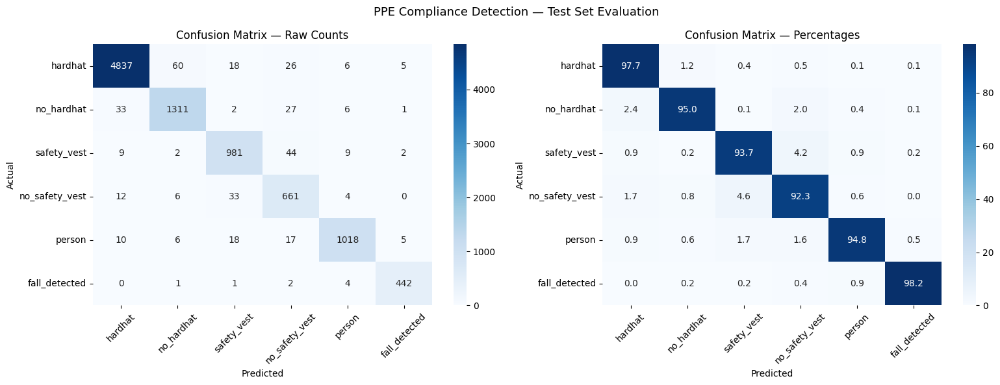

In [15]:
# Detailed per class metrics
class_names = list(FINAL_CLASSES.values())

print('=' * 60)
print('CLASSIFICATION REPORT — TEST SET')
print('=' * 60)
print(classification_report(
    all_labels, all_preds,
    target_names=class_names,
    digits=4
))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Raw counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names,
            ax=axes[0])
axes[0].set_title('Confusion Matrix — Raw Counts')
axes[0].set_ylabel('Actual')
axes[0].set_xlabel('Predicted')
axes[0].tick_params(axis='x', rotation=45)
axes[0].tick_params(axis='y', rotation=0)

# Percentage
sns.heatmap(cm_percent, annot=True, fmt='.1f', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names,
            ax=axes[1])
axes[1].set_title('Confusion Matrix — Percentages')
axes[1].set_ylabel('Actual')
axes[1].set_xlabel('Predicted')
axes[1].tick_params(axis='x', rotation=45)
axes[1].tick_params(axis='y', rotation=0)

plt.suptitle('PPE Compliance Detection — Test Set Evaluation', fontsize=13)
plt.tight_layout()
plt.savefig('/kaggle/working/confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

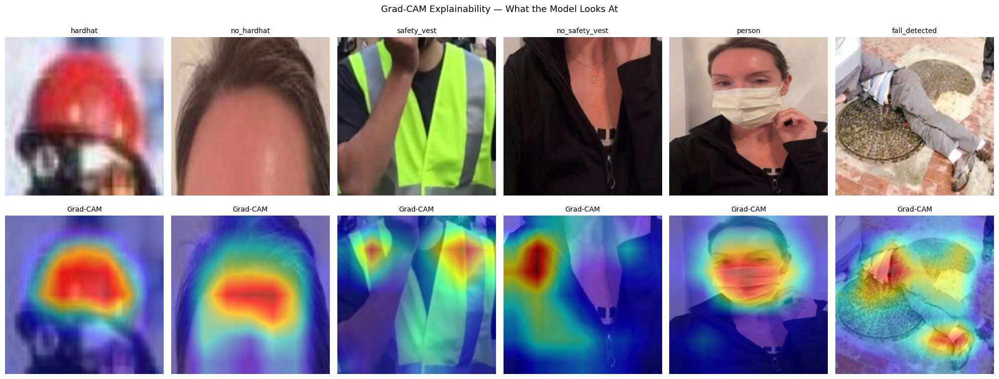

Grad-CAM saved


In [16]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Target the last convolutional block of EfficientNet
target_layers = [model.features[-1]]

# Get sample crops for visualization — one per class
fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for class_id in range(6):
    # Find a correctly predicted sample for this class
    class_indices = np.where(
        (np.array(all_labels) == class_id) & 
        (np.array(all_preds)  == class_id)
    )[0]
    
    if len(class_indices) == 0:
        continue
    
    sample_idx = class_indices[0]
    img_path, x1, y1, x2, y2, _ = test_dataset.samples[sample_idx]
    
    # Get original crop
    img  = Image.open(img_path).convert('RGB')
    crop = img.crop((x1, y1, x2, y2))
    crop = crop.resize((224, 224))
    img.close()
    
    # Normalize for display
    crop_np = np.array(crop).astype(np.float32) / 255.0
    
    # Prepare tensor for model
    transform = VAL_TRANSFORMS
    crop_tensor = transform(crop).unsqueeze(0).to(DEVICE)
    
    # Generate Grad-CAM
    with GradCAM(model=model, target_layers=target_layers) as cam:
        targets   = [ClassifierOutputTarget(class_id)]
        grayscale = cam(input_tensor=crop_tensor, targets=targets)
        cam_image = show_cam_on_image(crop_np, grayscale[0], use_rgb=True)
    
    # Display original crop
    axes[0][class_id].imshow(crop)
    axes[0][class_id].set_title(f'{FINAL_CLASSES[class_id]}', fontsize=10)
    axes[0][class_id].axis('off')
    
    # Display Grad-CAM
    axes[1][class_id].imshow(cam_image)
    axes[1][class_id].set_title(f'Grad-CAM', fontsize=10)
    axes[1][class_id].axis('off')

plt.suptitle('Grad-CAM Explainability — What the Model Looks At', fontsize=13)
plt.tight_layout()
plt.savefig('/kaggle/working/gradcam.png', dpi=150, bbox_inches='tight')
plt.show()
print('Grad-CAM saved')